In [1]:
!pip install tqdm

from tqdm import trange, notebook            # show progress-bar

In [2]:
!pip3 install tensorflow-estimator==2.6.0

     |████████████████████████████████| 462 kB 5.1 MB/s            
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-gpu 2.6.0 requires numpy~=1.19.2, but you have numpy 1.21.4 which is incompatible.
tensorflow-gpu 2.6.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
tensorflow-gpu 2.6.0 requires typing-extensions~=3.7.4, but you have typing-extensions 4.0.1 which is incompatible.


In [3]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [4]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [5]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [6]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [7]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmp1nb1gx6h.jpg.


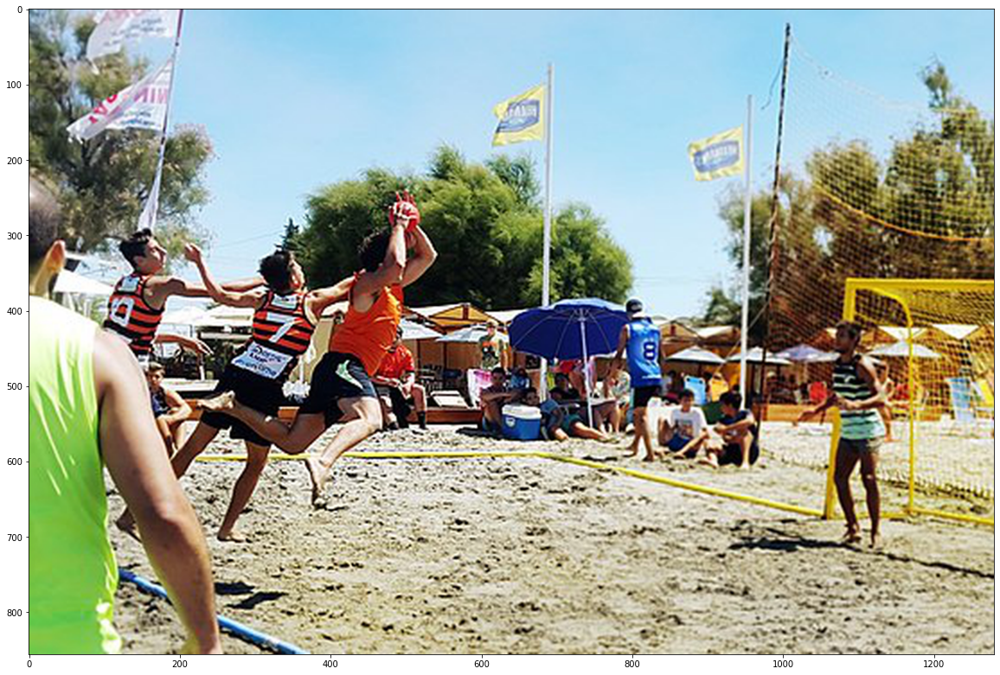

In [8]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

## inception_resnet_v2

In [9]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [10]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [11]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  48.36821365356445


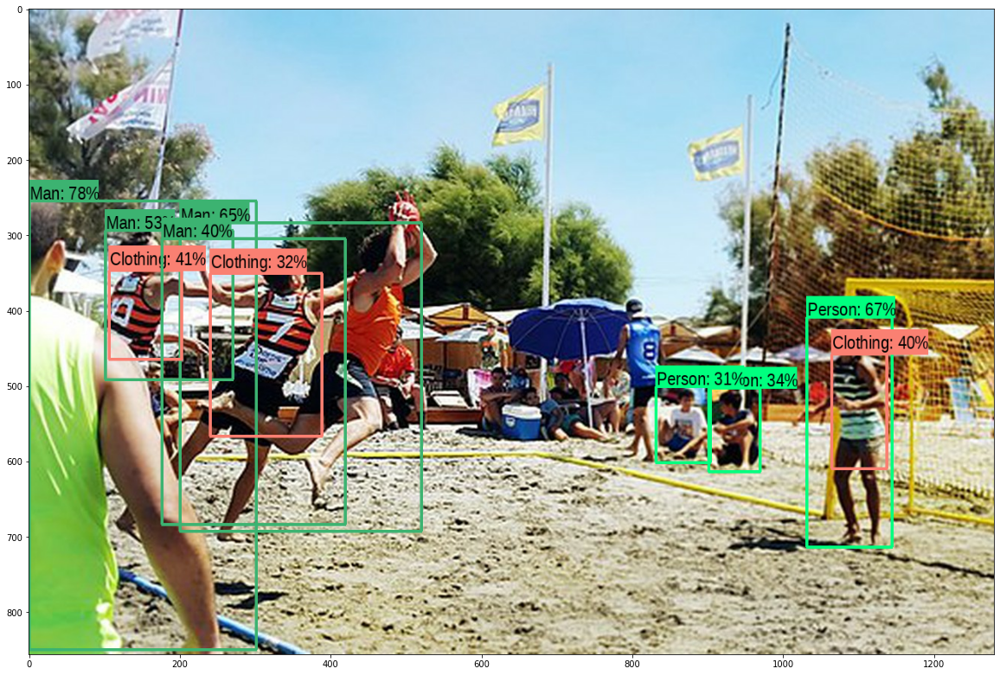

In [12]:
run_detector(detector, downloaded_image_path)

# 문제 2-1. 다른 이미지 테스트해보기

Image downloaded to /tmp/tmpo9zpj4qc.jpg.


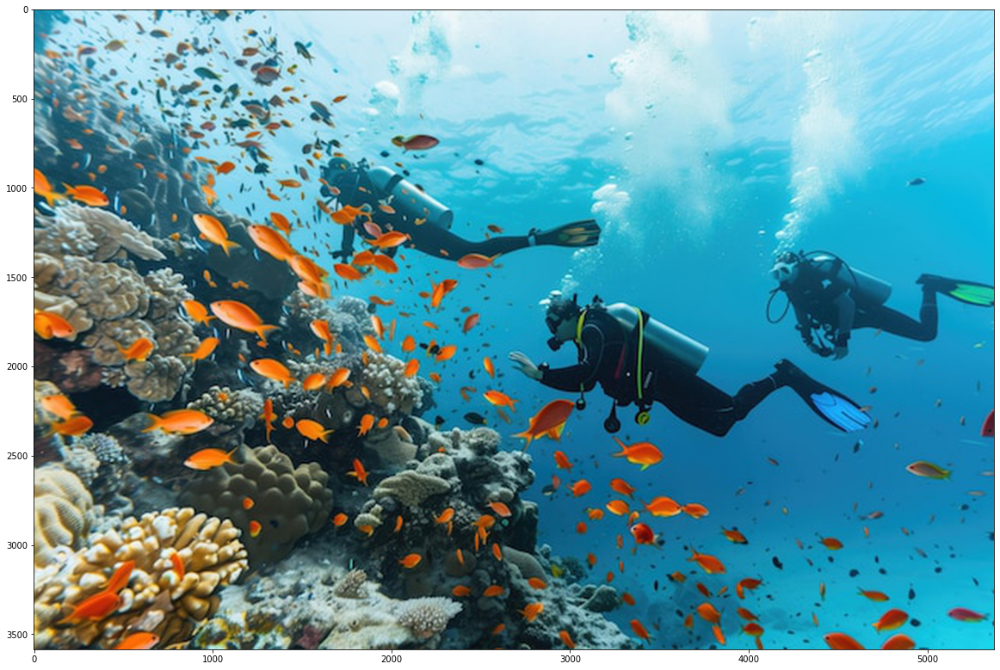

In [13]:
# 이미지 불러오기
image_url = "https://img.freepik.com/premium-photo/two-people-scuba-diving-coral-reef_1000823-222919.jpg"
downloaded_image_path = download_and_resize_image(image_url, 5376, 3584, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.5285232067108154


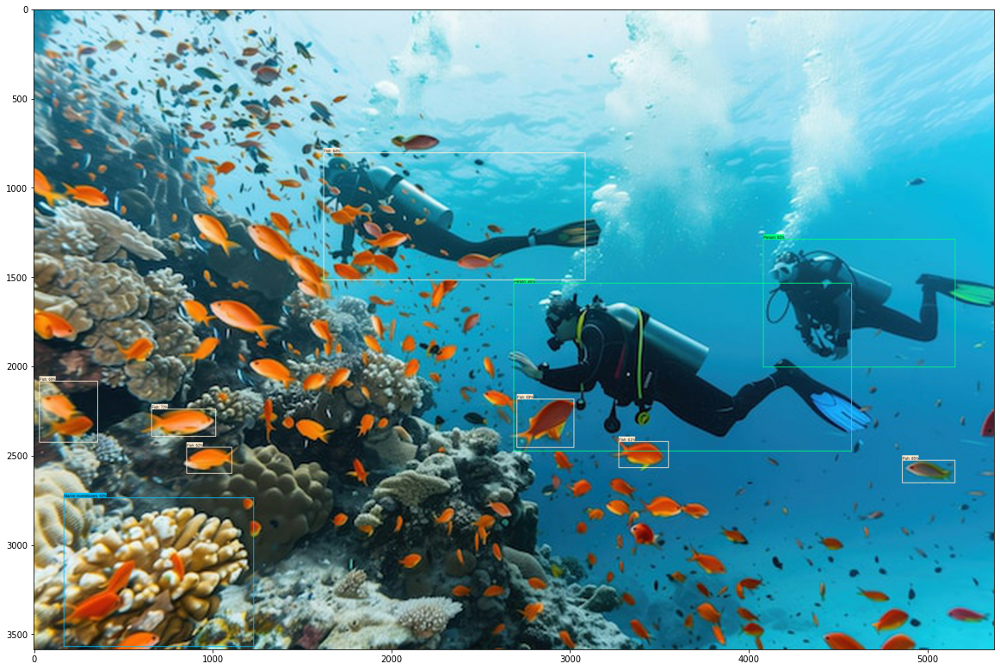

In [14]:
# 테스트
run_detector(detector, downloaded_image_path)

# 문제 2-2. 다양한 pre-trained model 테스트해보기

## efficientdet-lite2  모델

In [15]:
from PIL import Image
import time

# 기존의 이미지 다운로드 및 전처리 함수들은 그대로 유지

# 새로운 모델 로드
module_handle = "https://tfhub.dev/tensorflow/efficientdet/lite2/detection/1"
detector = hub.load(module_handle)

def run_detector(detector, path):
    img = load_img(path)
    
    # SSD ResNet50 모델은 640x640 크기의 입력을 예상합니다
    input_image = tf.image.resize(img, (640, 640))
    input_image = tf.cast(input_image, tf.uint8)  # uint8로 명시적 변환
    input_image = input_image[tf.newaxis, ...]
    
    # 소요시간 측정
    start_time = time.time()
    # SSD ResNet50 모델 실행 - 튜플로 반환됨
    detection_boxes, detection_scores, detection_classes, num_detections = detector(input_image)
    end_time = time.time()
    
    # numpy 배열로 변환
    boxes = detection_boxes.numpy()[0]
    scores = detection_scores.numpy()[0]
    classes = detection_classes.numpy()[0]
    num_detections = int(num_detections.numpy()[0])
    
    # 임계값 이상의 검출 결과만 필터링
    score_threshold = 0.3
    valid_detections = scores > score_threshold
    filtered_boxes = boxes[valid_detections]
    filtered_scores = scores[valid_detections]
    filtered_classes = classes[valid_detections]
    
    # COCO 클래스 이름으로 변환 (SSD ResNet50은 1부터 시작하므로 1을 빼줍니다)
    class_names = [COCO_CLASSES[int(i)-1] for i in filtered_classes]
    
    print(f"Found {len(filtered_scores)} objects above {score_threshold} threshold.")
    print("Inference time: ", end_time-start_time)
    
    # 이미지에 박스 그리기
    image_with_boxes = draw_boxes(
        img.numpy(), 
        filtered_boxes,
        class_names,
        filtered_scores
    )
    
    display_image(image_with_boxes)

# COCO 데이터셋의 클래스 이름 (EfficientDet은 COCO 데이터셋으로 학습됨)
COCO_CLASSES = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
    'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork',
    'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
    'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
    'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv',
    'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
    'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase',
    'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]



In [16]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                                25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i],  # decode 제거
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
                image_pil,
                ymin,
                xmin,
                ymax,
                xmax,
                color,
                font,
                display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

In [17]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856)

Image downloaded to /tmp/tmpub7qg2je.jpg.


Found 11 objects above 0.3 threshold.
Inference time:  4.008562803268433


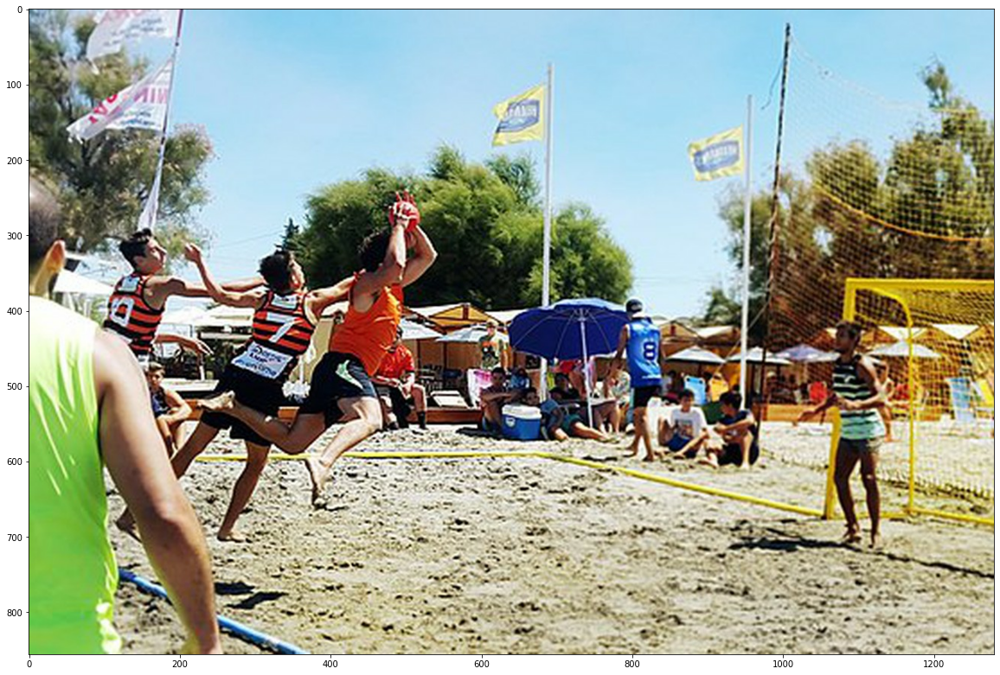

In [18]:
run_detector(detector, downloaded_image_path)

In [19]:
image_url = "https://img.freepik.com/premium-photo/two-people-scuba-diving-coral-reef_1000823-222919.jpg"
downloaded_image_path = download_and_resize_image(image_url, 5376, 3584)

Image downloaded to /tmp/tmpce4zakht.jpg.


Found 3 objects above 0.3 threshold.
Inference time:  0.037603139877319336


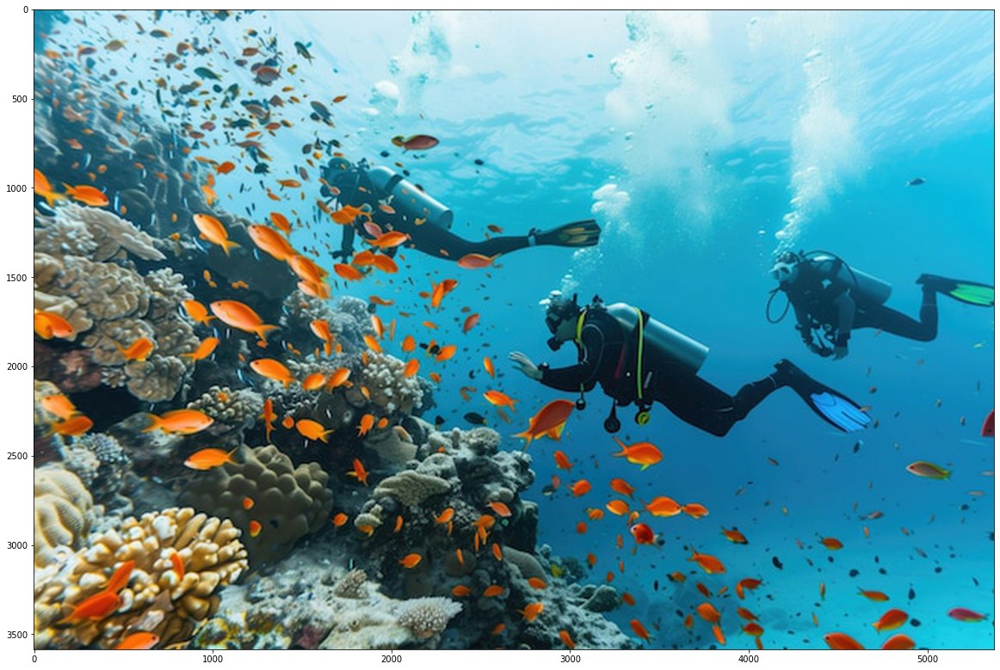

In [20]:
run_detector(detector, downloaded_image_path)

## CenterNet HourGlass 512x512 keypoints detection 모델

In [21]:
# 모델 로드
module_handle = "https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1"
detector = hub.load(module_handle)

def run_detector(detector, path):
    img = load_img(path)
    
    # 입력 이미지 전처리
    input_image = tf.image.resize(img, (512, 512))
    input_image = tf.cast(input_image, tf.uint8)
    input_image = input_image[tf.newaxis, ...]
    
    # 소요시간 측정
    start_time = time.time()
    # 모델 실행
    result = detector(input_image)  # 전체 결과를 딕셔너리로 받음
    end_time = time.time()
    
    # 결과를 numpy 배열로 변환
    boxes = result["detection_boxes"][0].numpy()
    scores = result["detection_scores"][0].numpy()
    classes = result["detection_classes"][0].numpy()
    
    # 임계값 이상의 검출 결과만 필터링
    score_threshold = 0.3
    valid_detections = scores > score_threshold
    filtered_boxes = boxes[valid_detections]
    filtered_scores = scores[valid_detections]
    filtered_classes = classes[valid_detections]
    
    # COCO 클래스 이름으로 변환
    class_names = [COCO_CLASSES[int(i)] for i in filtered_classes]
    
    print(f"Found {len(filtered_scores)} objects above {score_threshold} threshold.")
    print("Inference time: ", end_time-start_time)
    
    # 이미지에 박스 그리기
    image_with_boxes = draw_boxes(
        img.numpy(), 
        filtered_boxes,
        class_names,
        filtered_scores
    )
    
    display_image(image_with_boxes)

def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                                25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i],
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
                image_pil,
                ymin,
                xmin,
                ymax,
                xmax,
                color,
                font,
                display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image


In [22]:
# 테스트 실행
image_url = "https://img.freepik.com/premium-photo/two-people-scuba-diving-coral-reef_1000823-222919.jpg"
downloaded_image_path = download_and_resize_image(image_url, 5376, 3584)

Image downloaded to /tmp/tmpqwtw0apa.jpg.


Found 3 objects above 0.3 threshold.
Inference time:  4.696259260177612


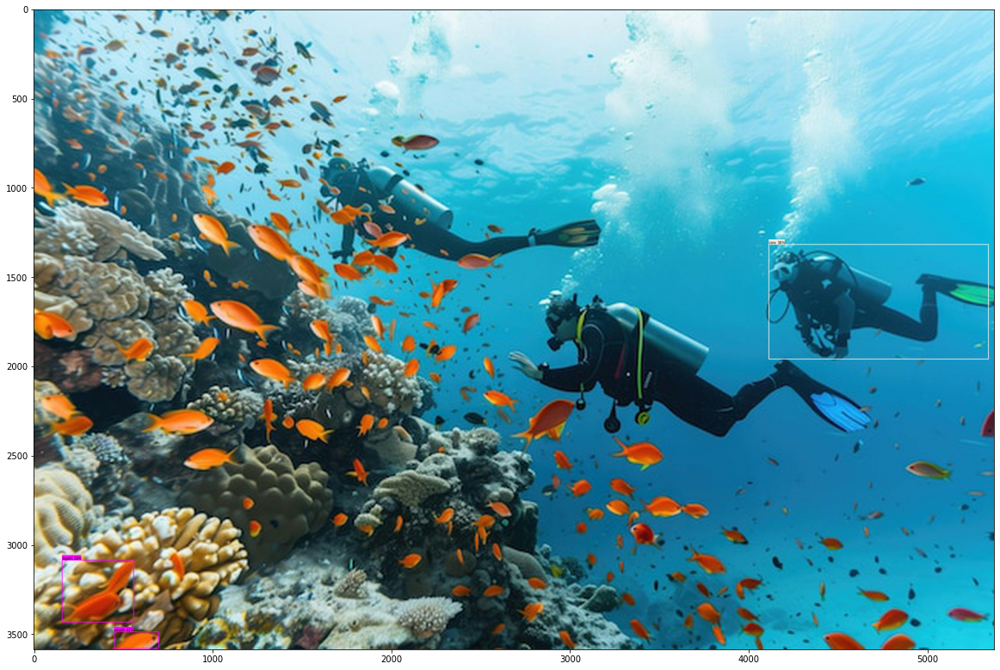

In [23]:
# 모델 실행
run_detector(detector, downloaded_image_path)

In [24]:
image_url = "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202201/27/45910784-d4fd-49f5-8318-688396ab6b6d.jpg"
downloaded_image_path = download_and_resize_image(image_url, 559, 373)



Image downloaded to /tmp/tmpd4_f1a3d.jpg.


Found 3 objects above 0.3 threshold.
Inference time:  0.24443435668945312


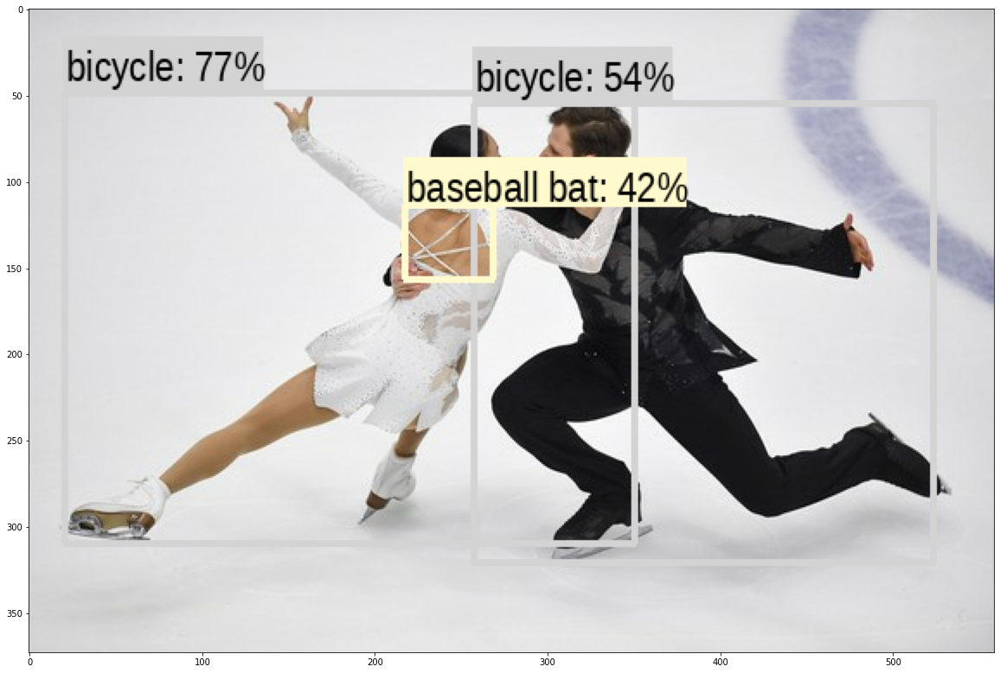

In [25]:
# 모델 실행
run_detector(detector, downloaded_image_path)

##  CenterNet HourGlass 모델로 사람의 keypoint를 감지하는 코드

In [26]:
def run_detector(detector, path):
    img = load_img(path)
    
    # 입력 이미지 전처리
    input_image = tf.image.resize(img, (512, 512))
    input_image = tf.cast(input_image, tf.uint8)
    input_image = input_image[tf.newaxis, ...]
    
    # 소요시간 측정
    start_time = time.time()
    # 모델 실행
    result = detector(input_image)
    end_time = time.time()
    
    # keypoints 결과 추출
    keypoints = result["detection_keypoints"][0].numpy()  # shape: [num_detections, 17, 2]
    keypoint_scores = result["detection_keypoint_scores"][0].numpy()  # shape: [num_detections, 17]
    boxes = result["detection_boxes"][0].numpy()
    scores = result["detection_scores"][0].numpy()
    classes = result["detection_classes"][0].numpy()
    
    # 임계값 이상의 사람 검출 결과만 필터링
    score_threshold = 0.3
    valid_detections = (scores > score_threshold) & (classes == 1)  # class 1은 사람
    filtered_boxes = boxes[valid_detections]
    filtered_scores = scores[valid_detections]
    filtered_keypoints = keypoints[valid_detections]
    filtered_keypoint_scores = keypoint_scores[valid_detections]
    
    print(f"Found {len(filtered_scores)} people above {score_threshold} threshold.")
    print("Inference time: ", end_time-start_time)
    
    # 이미지에 keypoint 그리기
    image_with_keypoints = draw_keypoints(
        img.numpy(), 
        filtered_keypoints,
        filtered_keypoint_scores
    )
    
    display_image(image_with_keypoints)

def draw_keypoints(image, keypoints_all, keypoint_scores_all, min_score=0.2):
    """키포인트를 이미지에 그리는 함수"""
    image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
    draw = ImageDraw.Draw(image_pil)
    
    im_width, im_height = image_pil.size
    
    # COCO keypoints pairs for drawing lines between keypoints
    keypoint_pairs = [
        (5, 7), (7, 9), (6, 8), (8, 10),  # arms
        (11, 13), (13, 15), (12, 14), (14, 16),  # legs
        (5, 6), (5, 11), (6, 12), (11, 12)  # torso
    ]
    
    # 각 검출된 사람에 대해
    for keypoints, keypoint_scores in zip(keypoints_all, keypoint_scores_all):
        # 키포인트 그리기
        for i, (keypoint, score) in enumerate(zip(keypoints, keypoint_scores)):
            if score > min_score:
                x = int(keypoint[1] * im_width)
                y = int(keypoint[0] * im_height)
                draw.ellipse([x-3, y-3, x+3, y+3], fill='red')
        
        # 키포인트 사이 선 그리기
        for pair in keypoint_pairs:
            if (keypoint_scores[pair[0]] > min_score and 
                keypoint_scores[pair[1]] > min_score):
                
                x1 = int(keypoints[pair[0]][1] * im_width)
                y1 = int(keypoints[pair[0]][0] * im_height)
                x2 = int(keypoints[pair[1]][1] * im_width)
                y2 = int(keypoints[pair[1]][0] * im_height)
                
                draw.line([(x1, y1), (x2, y2)], fill='yellow', width=2)
    
    return np.array(image_pil)


In [27]:
# COCO keypoint names (참고용)
KEYPOINT_NAMES = [
    'nose', 'left_eye', 'right_eye', 'left_ear', 'right_ear',
    'left_shoulder', 'right_shoulder', 'left_elbow', 'right_elbow',
    'left_wrist', 'right_wrist', 'left_hip', 'right_hip',
    'left_knee', 'right_knee', 'left_ankle', 'right_ankle'
]

In [28]:
image_url = "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202201/27/45910784-d4fd-49f5-8318-688396ab6b6d.jpg"
downloaded_image_path = download_and_resize_image(image_url, 559, 373)

Image downloaded to /tmp/tmp2dr5_9de.jpg.


Found 2 people above 0.3 threshold.
Inference time:  0.22975993156433105


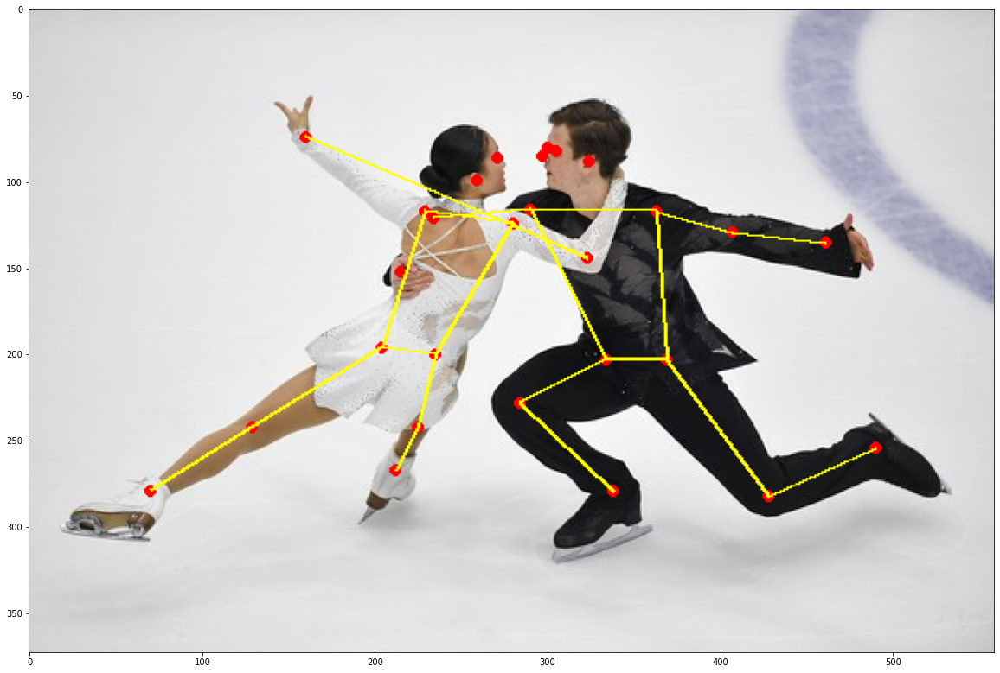

In [29]:
# 모델 실행
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmpv5c942at.jpg.


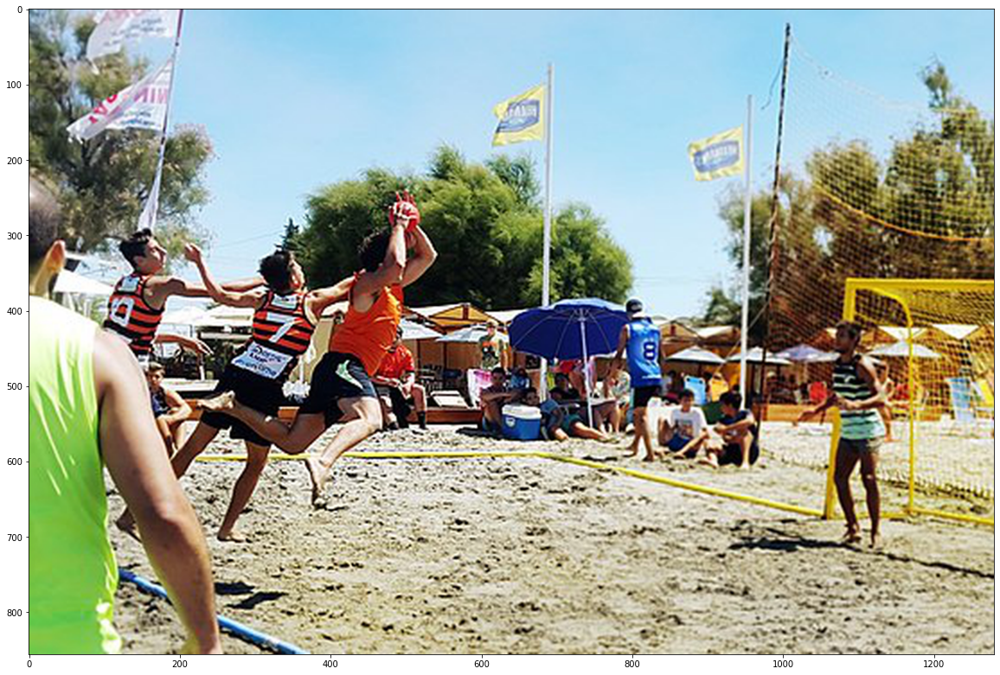

In [30]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  

Found 11 people above 0.3 threshold.
Inference time:  0.2484424114227295


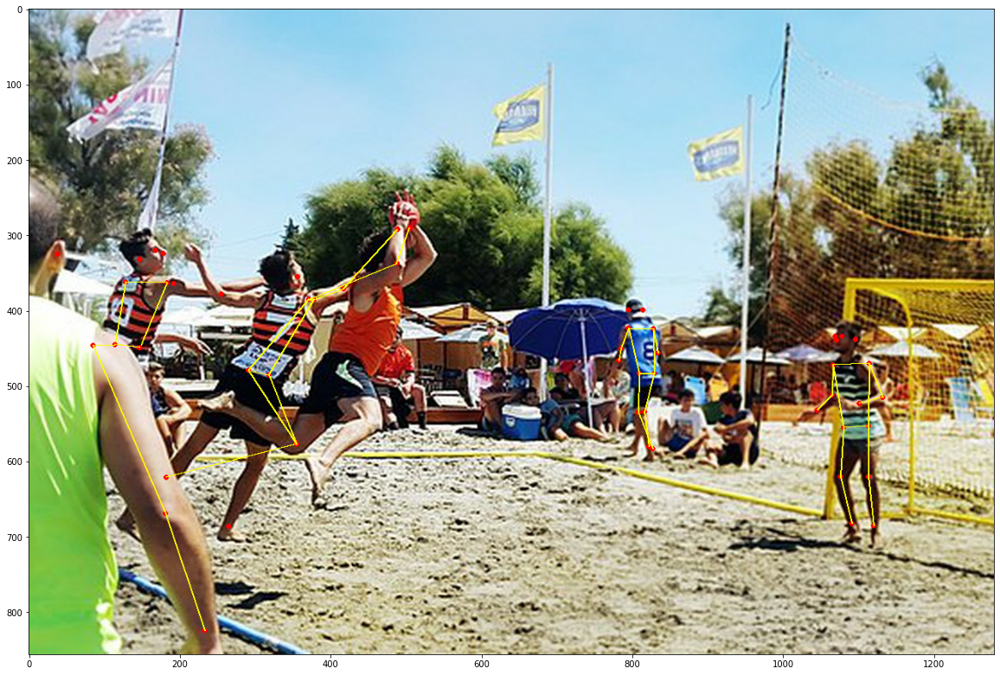

In [31]:
# 모델 실행
run_detector(detector, downloaded_image_path)

In [32]:
# ==========================
# ✅ 모델별 특징 및 탐지 결과 (실제 실행 결과 기반)
# ==========================

# 🔹 Inception-ResNet-v2 기반 객체 감지 모델
# - TensorFlow Hub에서 제공하는 CNN 기반 고정밀 객체 감지 모델
# - 이미지에서 다양한 객체를 탐지할 수 있으며, 정확도가 높지만 속도가 상대적으로 느림
# - 테스트 결과:
#   1) 비치발리볼
#      - 탐지된 객체 수: 100개
#      - 추론 속도: 48.37초
#   2) 바닷속 잠수부
#      - 탐지된 객체 수: 100개
#      - 추론 속도: 1.53초
# - 장점: 높은 정확도, 다양한 객체 탐지 가능
# - 단점: 속도가 매우 느려 실시간 감지에는 부적합

# 🔹 EfficientDet-Lite2 모델
# - TensorFlow Hub의 EfficientDet Lite2 모델 사용 (경량화된 객체 감지 모델)
# - 속도와 정확도의 균형을 맞춘 최적화된 경량 모델
# - 테스트 결과:
#   1) 비치발리볼
#      - 탐지된 객체 수: 11개 (0.3 신뢰도 이상)
#      - 추론 속도: 4.01초
#   2) 바닷속 잠수부
#      - 탐지된 객체 수: 3개 (0.3 신뢰도 이상)
#      - 추론 속도: 0.038초
# - 장점: 속도가 빠르고 비교적 정확도가 높음
# - 단점: 탐지할 수 있는 객체 수가 제한될 수 있음

# 🔹 CenterNet HourGlass 512x512 Keypoints Detection 모델
# - 사람의 관절(Keypoint)까지 감지하는 Human Pose Estimation 모델
# - COCO 데이터셋을 기반으로 학습된 모델로 17개의 관절 좌표 감지 가능
# - 테스트 결과:
#   1) 바닷속 잠수부
#      - 탐지된 객체 수: 3개 (0.3 신뢰도 이상)
#      - 추론 속도: 4.70초
#   2) 혼성피겨
#      - 탐지된 객체 수: 3개 (0.3 신뢰도 이상)
#      - 추론 속도: 0.24초
# - 장점: 사람의 자세 분석 가능, 다양한 움직임 인식 가능
# - 단점: 일반 객체 감지보다 속도가 느리고, 사람 이외의 객체 탐지는 제한적

# 🔹 CenterNet HourGlass 모델 (사람 Keypoint 감지)
# - Human Pose Estimation을 수행하여 사람의 관절을 탐지하는 모델
# - 특정 장면에서 사람의 자세를 더욱 정밀하게 분석 가능
# - 테스트 결과:
#   1) 혼성피겨
#      - 탐지된 사람 수: 2명 (0.3 신뢰도 이상)
#      - 추론 속도: 0.23초
#   2) 비치발리볼
#      - 탐지된 사람 수: 11명 (0.3 신뢰도 이상)
#      - 추론 속도: 0.25초
# - 장점: 빠른 속도로 사람의 키포인트 감지 가능, 동작 분석에 유용
# - 단점: 사람 이외의 객체 감지는 수행하지 않음

# ==========================
# 🎯 최적 모델 선택 (실제 결과 기반)
# ==========================

# - 일반 객체 감지가 필요하다면: EfficientDet-Lite2 (속도 + 적절한 정확도)
# - 고해상도 객체 감지가 필요하다면: Inception-ResNet-v2 (정확도 우수, 하지만 속도가 느림)
# - 사람의 자세 및 관절 분석이 필요하다면: CenterNet HourGlass (자세 인식 및 동작 감지)

# ==========================
# 🔍 결론 및 활용 추천
# ==========================
# 1) 실시간 객체 감지 (빠른 속도 필요) → EfficientDet-Lite2 (비치발리볼: 4.01초, 바닷속 잠수부: 0.038초)
# 2) 고정된 이미지에서 높은 정확도가 필요 → Inception-ResNet-v2 (비치발리볼: 48.37초, 바닷속 잠수부: 1.53초)
# 3) 사람의 동작 분석이 필요 → CenterNet HourGlass (혼성피겨: 0.23~0.24초, 비치발리볼: 0.25초)

# 사용 목적에 따라 최적의 모델을 선택하면 됨!
